# Visualization of the imputations
The imputations made with the STL algorithm in R are visualized here. Run this notebook with a python kernel. The data to be visualized here is the data available from the northwest station.

In [1]:
from pandas import read_csv, concat

In [2]:
#Visualization libraries
from matplotlib import pyplot as plt
from matplotlib import rcParams

In [3]:
figures_path='../images'

In [4]:
allvarsdf=read_csv('../data/Monterrey/processed/northweast_imputations.csv')
pm25nwdf=read_csv('../data/Monterrey/processed/northweast_pm5_decomposed.csv')
rainfwdf=read_csv('../data/Monterrey/processed/northweast_RAINF_decomposed.csv')

## Plotting imputation for Northwest station
Here we keep exploring the imputations for the northwest station.

In [5]:
allvarsdf.loc[:,'date'].head()

0    2011.999886
1    2012.000000
2    2012.000114
3    2012.000228
4    2012.000342
Name: date, dtype: float64

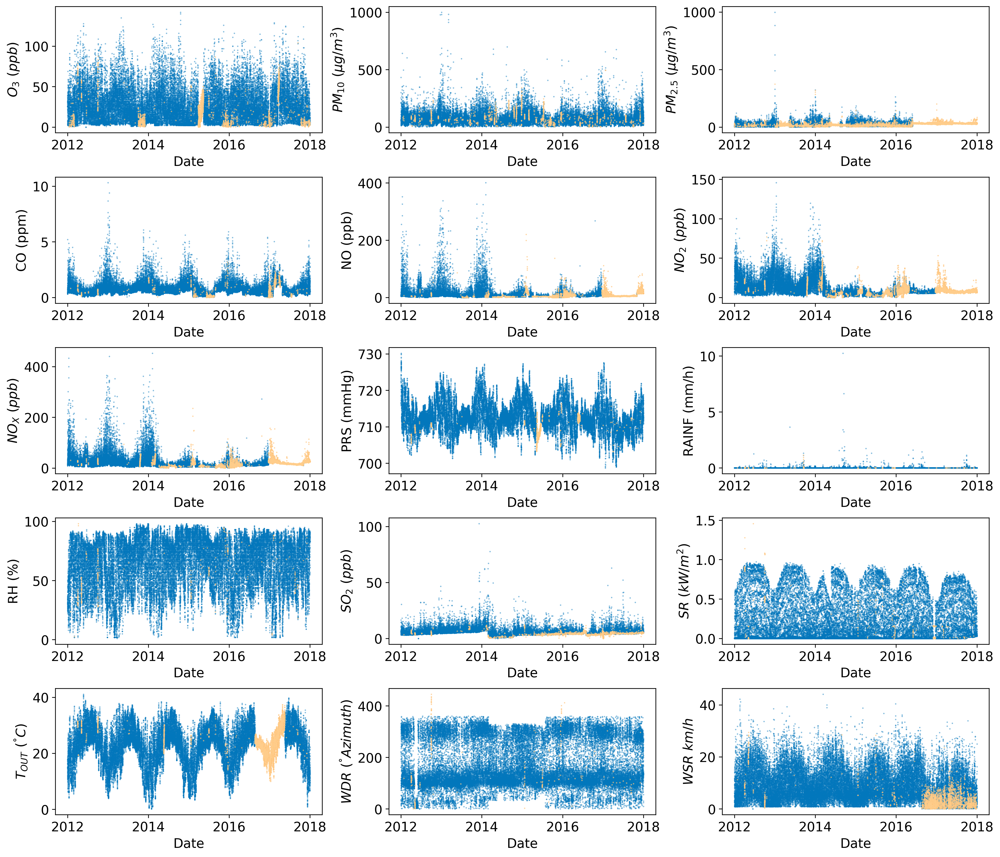

In [6]:
from os import path
rcParams['text.usetex'] = False
rcParams.update({'font.size': 14})

fig, axs= plt.subplots(5,3, figsize=(18,16), dpi=300)

var_list=['O3','PM10','PM2.5','CO','NO','NO2','NOX','PRS','RAINF','RH','SO2','SR','TOUT','WDR','WSR']

var_name='PM2.5'

figs_labels=['$O_3\ (ppb)$',
 '$PM_{10}\ (\mu g/m^3)$',
 '$PM_{2.5}\ (\mu g/m^3)$','CO (ppm)',
 'NO (ppb)',
 '$NO_2\ (ppb)$',
 '$NO_X\ (ppb)$',
 'PRS (mmHg)',
 'RAINF (mm/h)',
 'RH (%)',
 '$SO_2\ (ppb)$',
 '$SR\ (kW/m^2)$',
 '$T_{OUT}\ (^{\degree}C)$',
 '$WDR\ (^{\degree} Azimuth)$',
 '$WSR\ km/h$']
c=0
for item in axs:
    for grph in item:        
        x_given=allvarsdf.loc[allvarsdf[var_list[c]+'_miss']!='Missing',['date',var_list[c]]]
        x_imp=allvarsdf.loc[allvarsdf[var_list[c]+'_miss']=='Missing',['date',var_list[c]]]
        grph.plot(x_given.iloc[:,0],x_given.iloc[:,1], **{'ls':'', 'marker':'.', 'ms':1, 'mec':'#0277BD', 'alpha':0.5})
        grph.plot(x_imp.iloc[:,0],x_imp.iloc[:,1], **{'ls':'', 'marker':'.', 'ms':1, 'mec':'#FFCE8C', 'alpha':0.7})
        grph.set_xlabel('Date')
        grph.set_ylabel(figs_labels[c])
        c+=1

fig.subplots_adjust(wspace=0.25,hspace=0.35)
rcParams['text.usetex'] = False
fig.savefig(path.join(figures_path,'imputation_data_noroeste.pdf'), format='pdf')
#fig.savefig(path.join(figures_path,'imputation_data_noroeste.eps'), format='eps')

In [7]:
fig.savefig(path.join(figures_path,'imputation_data_noroeste.jpg'), bbox_inches = 'tight',pad_inches = 0)

## Visualization of seasonal decomposition for PM2.5

In [8]:
allvarsdf.columns

Index(['Unnamed: 0', 'CO', 'NO', 'NO2', 'NOX', 'O3', 'PM10', 'PM2.5', 'PRS',
       'RAINF', 'RH', 'SO2', 'SR', 'TOUT', 'WDR', 'WSR', 'date', 'CO_miss',
       'NO_miss', 'NO2_miss', 'NOX_miss', 'O3_miss', 'PM10_miss', 'PM2.5_miss',
       'PRS_miss', 'RAINF_miss', 'RH_miss', 'SO2_miss', 'SR_miss', 'TOUT_miss',
       'WDR_miss', 'WSR_miss'],
      dtype='object')

In [9]:
allvarsdf.loc[:,['PM2.5','PM2.5_miss']].shape

(52608, 2)

In [10]:
pm25nwdf.head()

,Unnamed: 0,Index,Data,seasonal,trend,remainder
0,1,2011.999886,18.552402,16.529097,NaN,NaN
1,2,2012.000000,21.623684,35.504156,NaN,NaN
2,3,2012.000114,23.594635,10.564856,NaN,NaN
3,4,2012.000228,33.931425,3.381263,NaN,NaN
4,5,2012.000342,16.878467,4.221316,NaN,NaN


In [11]:
seasonal25df=concat([pm25nwdf,allvarsdf.loc[:,['PM2.5','PM2.5_miss']]], ignore_index=True, sort=False, axis=1)
seasonal25df=seasonal25df.drop(columns=[6,0]).rename(columns={1:'Date',2:'Measure', 3:'Seasonal',4:'Trend',5:'Remainder', 7:'Missingness'})

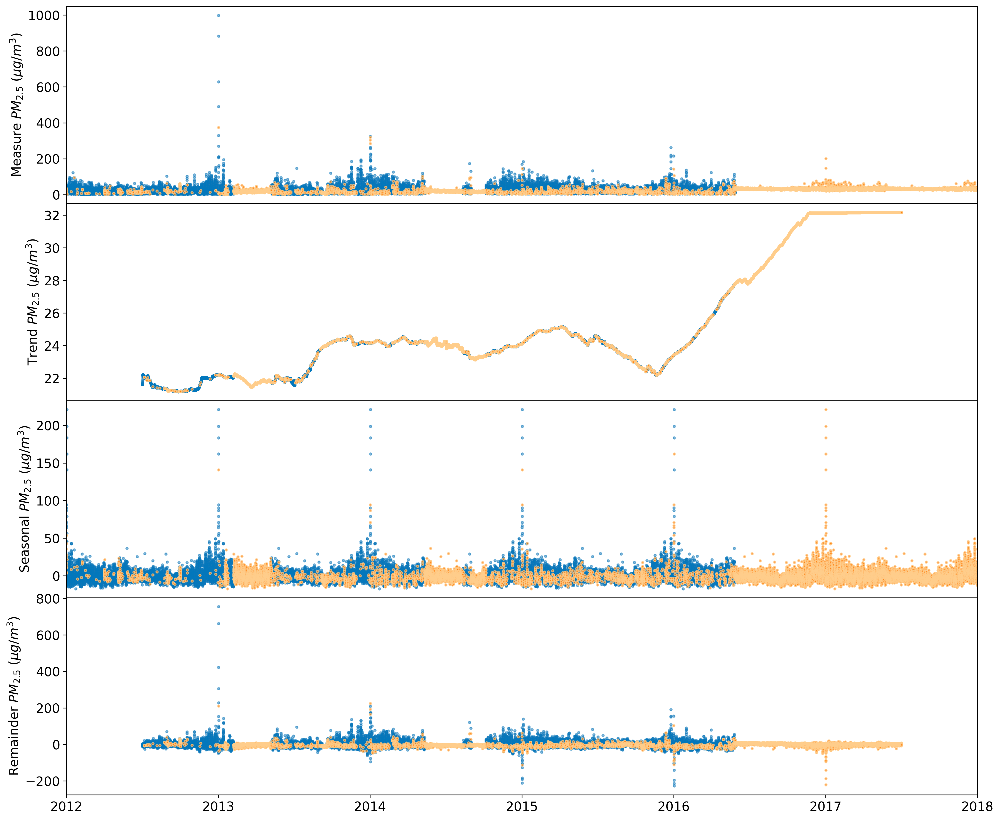

In [12]:
fig, axs= plt.subplots(4,1, figsize=(18,16), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

pltimputeddf=seasonal25df[seasonal25df['Missingness']=='Missing']
pltgivendf=seasonal25df[seasonal25df['Missingness']!='Missing']

decomposed_labels=['Measure', 'Trend','Seasonal', 'Remainder']
c=0
for item in axs:
    item.plot(pltgivendf['Date'],pltgivendf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#0277BD', 'alpha':0.5})
    item.plot(pltimputeddf['Date'],pltimputeddf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#FFCE8C', 'alpha':0.7})
    item.set_xlim([2012,2018])
    item.set_ylabel(decomposed_labels[c]+ ' $PM_{2.5}\ (\mu g/m^3)$')
    c+=1

In [13]:
fig.savefig(path.join(figures_path,'decomposition_northwest.jpg'))

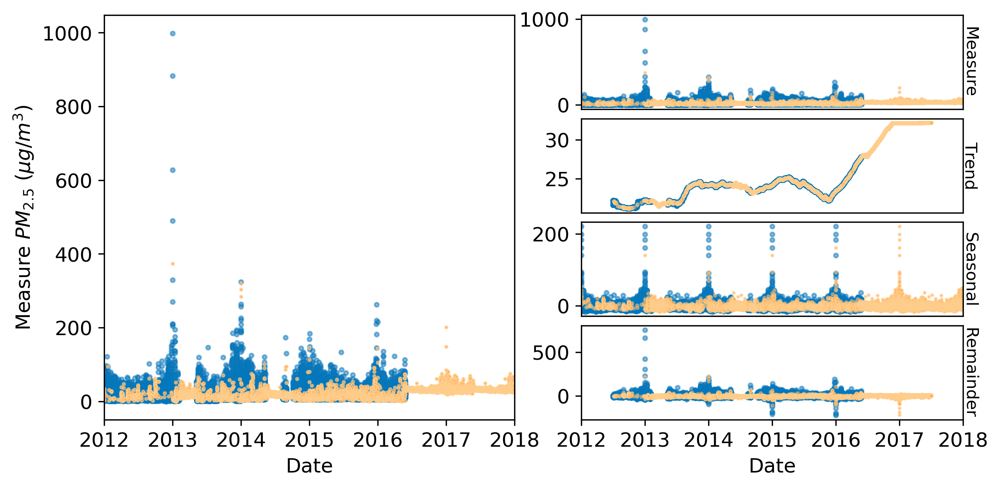

In [14]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

decomposed_labels=['Measure','Trend','Seasonal','Remainder']

gridfig = plt.figure(figsize=(8,4.5), dpi=300)
obsgrid = gridfig.add_gridspec(nrows=1, ncols=1, left=0.05, right=0.48)
decompgrid = gridfig.add_gridspec(nrows=len(decomposed_labels), ncols=1, left= 0.55, right=0.95, hspace=0.1)
rcParams.update({'font.size': 12})

decom_axes=list()
c=0
for i in decomposed_labels:
    decom_axes.append(gridfig.add_subplot(decompgrid[c,0]))
    decom_axes[-1].plot(pltgivendf['Date'],pltgivendf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#0277BD', 'alpha':0.5})
    decom_axes[-1].plot(pltimputeddf['Date'],pltimputeddf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':3, 'mec':'#FFCE8C', 'alpha':0.5})
    decom_axes[-1].yaxis.set_label_position("right")
    decom_axes[-1].set_ylabel(decomposed_labels[c], **{'size':10,'rotation':-90, 'rotation_mode':'default', 'va':'center'})
    decom_axes[-1].set_xlim([2012,2018])
    if c==3:
        decom_axes[-1].set_xlabel('Date')
        break
    decom_axes[-1].set_xticks([])
    c+=1
    
gridfig.align_ylabels()

f1= gridfig.add_subplot(obsgrid[:,:])
f1.plot(pltgivendf['Date'],pltgivendf['Measure'], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#0277BD', 'alpha':0.5})
f1.plot(pltimputeddf['Date'],pltimputeddf['Measure'], **{'ls':'', 'marker':'.', 'ms':3, 'mec':'#FFCE8C', 'alpha':0.7})
f1.set_ylabel(decomposed_labels[0]+ ' $PM_{2.5}\ (\mu g/m^3)$')
f1.set_xlabel('Date')
f1.set_xlim([2012,2018])

gridfig.savefig(path.join(figures_path,'decomposition_northwest.jpg'),bbox_inches = 'tight',pad_inches = 0)
gridfig.savefig(path.join(figures_path,'decomposition_northwest.pdf'), format='pdf', bbox_inches = 'tight',pad_inches = 0)

## Visualization of seasonal decomposition for RAINF

In [15]:
allvarsdf.columns

Index(['Unnamed: 0', 'CO', 'NO', 'NO2', 'NOX', 'O3', 'PM10', 'PM2.5', 'PRS',
       'RAINF', 'RH', 'SO2', 'SR', 'TOUT', 'WDR', 'WSR', 'date', 'CO_miss',
       'NO_miss', 'NO2_miss', 'NOX_miss', 'O3_miss', 'PM10_miss', 'PM2.5_miss',
       'PRS_miss', 'RAINF_miss', 'RH_miss', 'SO2_miss', 'SR_miss', 'TOUT_miss',
       'WDR_miss', 'WSR_miss'],
      dtype='object')

In [16]:
allvarsdf.loc[:,['RAINF','RAINF_miss']].shape

(52608, 2)

In [17]:
rainfwdf.head()

,Unnamed: 0,Index,Data,seasonal,trend,remainder
0,1,2011.999886,0.0,-0.001155,NaN,NaN
1,2,2012.000000,0.0,0.004825,NaN,NaN
2,3,2012.000114,0.0,0.000825,NaN,NaN
3,4,2012.000228,0.0,-0.003175,NaN,NaN
4,5,2012.000342,0.0,-0.003175,NaN,NaN


In [18]:
seasonal25df=concat([rainfwdf,allvarsdf.loc[:,['RAINF','RAINF_miss']]], ignore_index=True, sort=False, axis=1)
seasonal25df=seasonal25df.drop(columns=[6,0]).rename(columns={1:'Date',2:'Measure', 3:'Seasonal',4:'Trend',5:'Remainder', 7:'Missingness'})

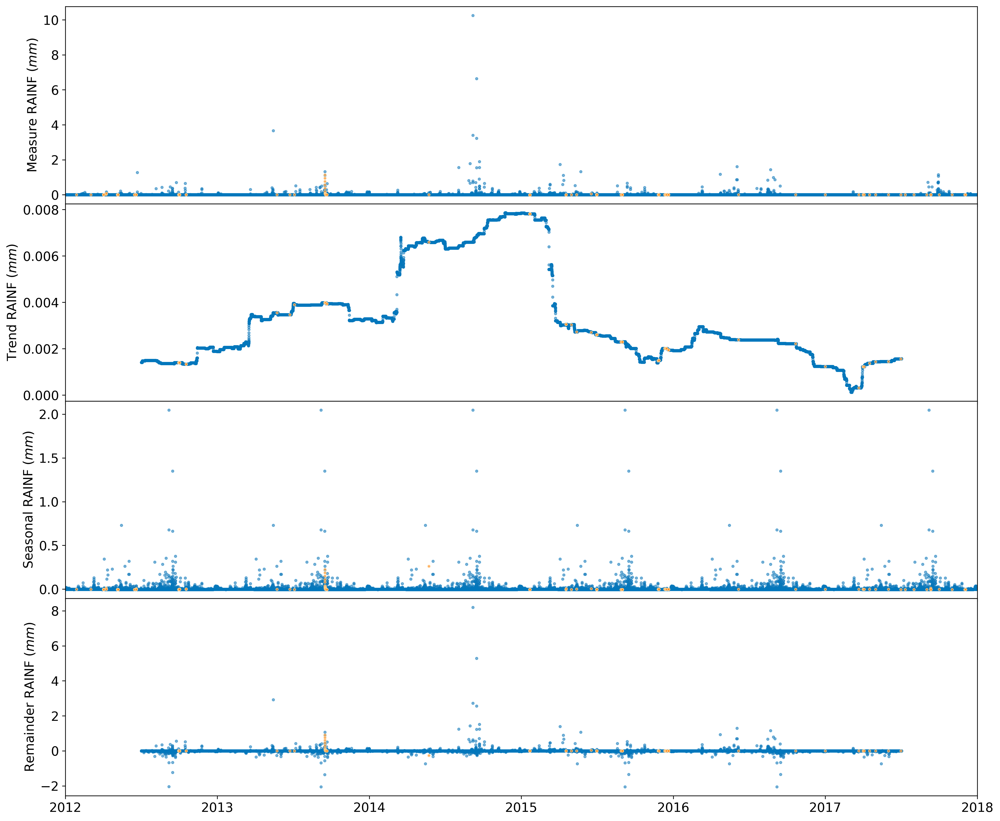

In [19]:
fig, axs= plt.subplots(4,1, figsize=(18,16), dpi=300, sharex=True)
fig.subplots_adjust(hspace=0)

pltimputeddf=seasonal25df[seasonal25df['Missingness']=='Missing']
pltgivendf=seasonal25df[seasonal25df['Missingness']!='Missing']

decomposed_labels=['Measure', 'Trend','Seasonal', 'Remainder']
c=0
for item in axs:
    item.plot(pltgivendf['Date'],pltgivendf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#0277BD', 'alpha':0.5})
    item.plot(pltimputeddf['Date'],pltimputeddf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#FFCE8C', 'alpha':0.7})
    item.set_xlim([2012,2018])
    item.set_ylabel(decomposed_labels[c]+ ' RAINF $(mm)$')
    c+=1


In [20]:
fig.savefig(path.join(figures_path,'decomposition_northwest_RAINF.jpg'))

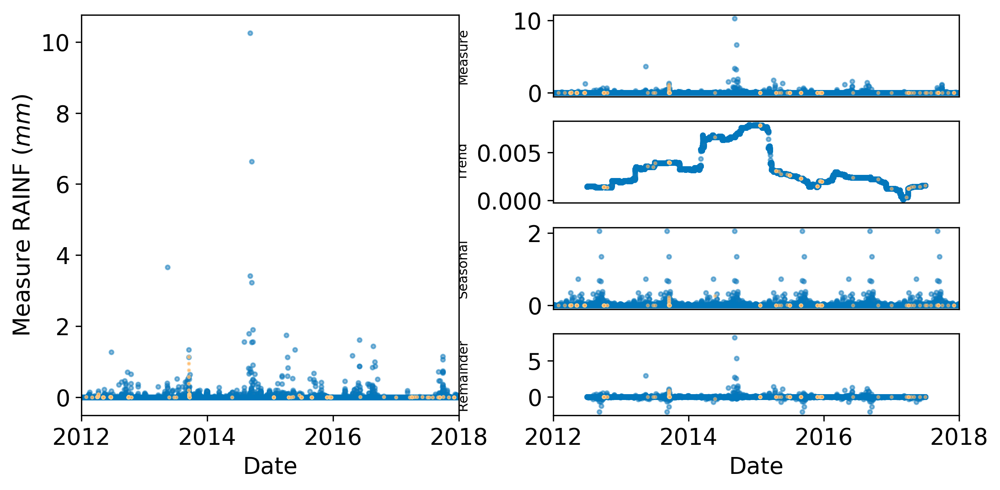

In [21]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

decomposed_labels=['Measure','Trend','Seasonal','Remainder']

gridfig = plt.figure(figsize=(8,4.5), dpi=300)
obsgrid = gridfig.add_gridspec(nrows=1, ncols=1, left=0.05, right=0.45)
decompgrid = gridfig.add_gridspec(nrows=len(decomposed_labels), ncols=1, left= 0.55, right=0.98, hspace=0.3)

decom_axes=list()
c=0
for i in decomposed_labels:
    decom_axes.append(gridfig.add_subplot(decompgrid[c,0]))
    decom_axes[-1].plot(pltgivendf['Date'],pltgivendf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#0277BD', 'alpha':0.5})
    decom_axes[-1].plot(pltimputeddf['Date'],pltimputeddf[decomposed_labels[c]], **{'ls':'', 'marker':'.', 'ms':3, 'mec':'#FFCE8C', 'alpha':0.5})
    decom_axes[-1].set_ylabel(decomposed_labels[c], **{'size':8})
    decom_axes[-1].set_xlim([2012,2018])
    if c==3:
        decom_axes[-1].set_xlabel('Date')
        break
    decom_axes[-1].set_xticks([])
    c+=1
    
gridfig.align_ylabels()

f1= gridfig.add_subplot(obsgrid[:,:])
f1.plot(pltgivendf['Date'],pltgivendf['Measure'], **{'ls':'', 'marker':'.', 'ms':5, 'mec':'#0277BD', 'alpha':0.5})
f1.plot(pltimputeddf['Date'],pltimputeddf['Measure'], **{'ls':'', 'marker':'.', 'ms':3, 'mec':'#FFCE8C', 'alpha':0.7})
f1.set_ylabel(decomposed_labels[0]+ ' RAINF $(mm)$')
f1.set_xlabel('Date')
f1.set_xlim([2012,2018])

gridfig.savefig(path.join(figures_path,'decomposition_RAINF_northwest.jpg'))
gridfig.savefig(path.join(figures_path,'decomposition_RAINF_northwest.pdf'), format='pdf')